In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import h5py
import numpy as np
import mne
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

# path del tuo file .h5
path = "/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/processed/11_S002.h5"

# apri in sola lettura
with h5py.File(path, 'r') as f:
    print("📂 Contenuto del file:")
    print(list(f.keys()))  # mostra i dataset principali
    
    data = f['data'][:]      # (epoche, canali, campioni)
    labels = f['labels'][:]  # etichette (es. target)
    subject = f['subject'][:]  # id soggetto/sessione

print("✅ Dati caricati:")
print("data shape:", data.shape)
print("labels shape:", labels.shape)
print("subject shape:", subject.shape)


📂 Contenuto del file:
['data', 'labels', 'subject']
✅ Dati caricati:
data shape: (214, 61, 384)
labels shape: (214,)
subject shape: (214,)


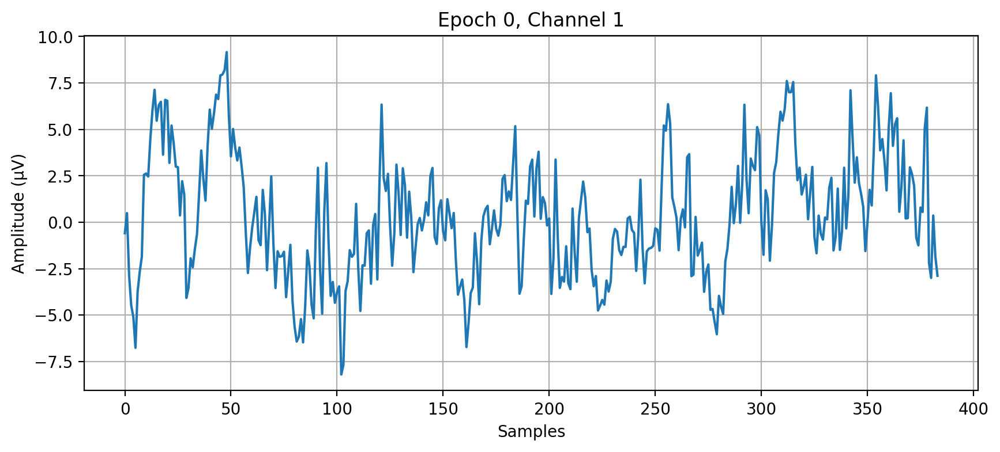

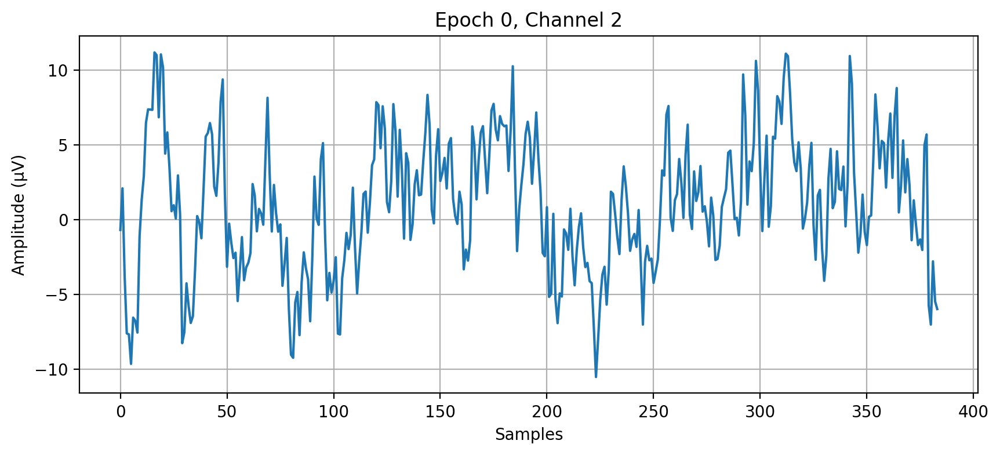

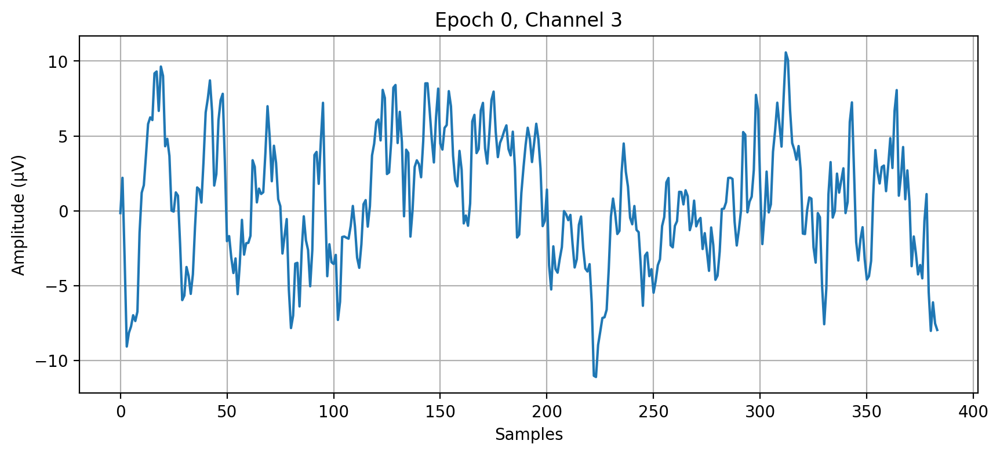

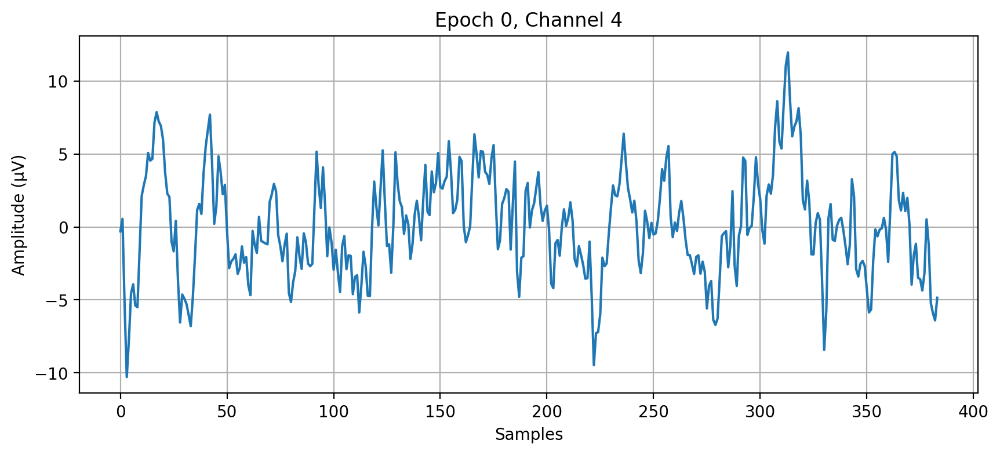

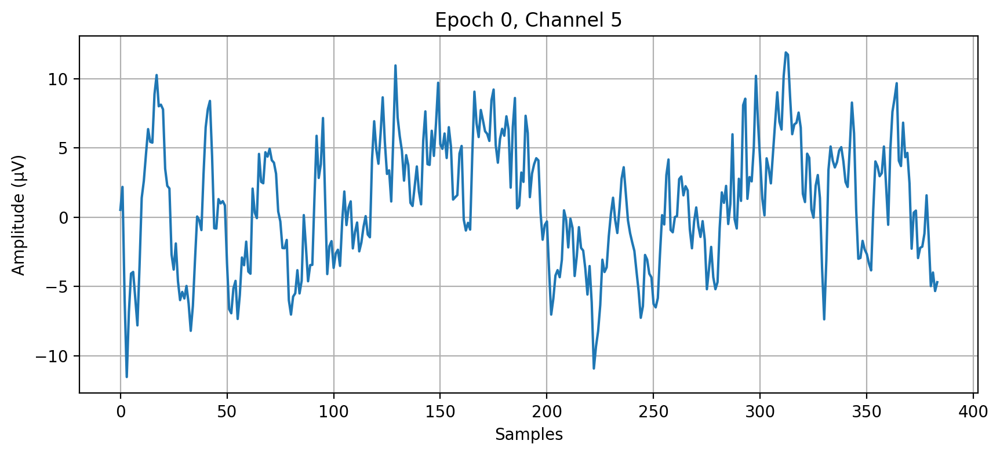

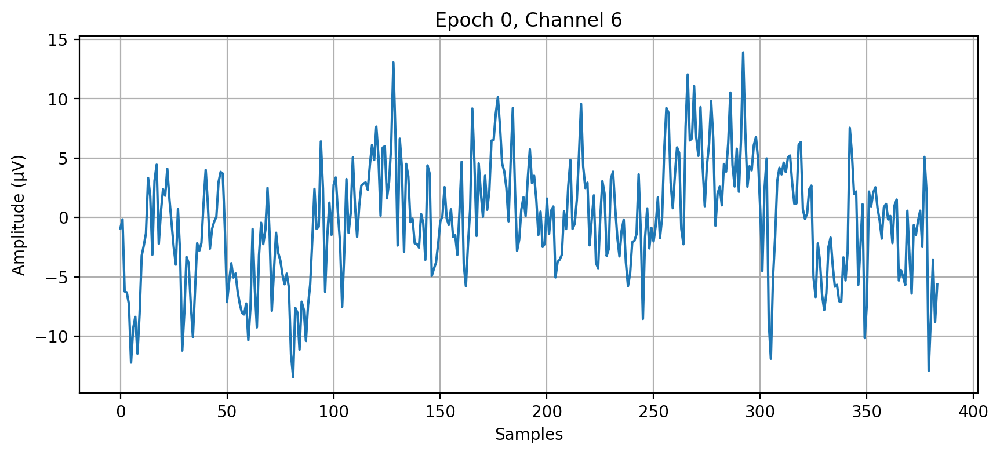

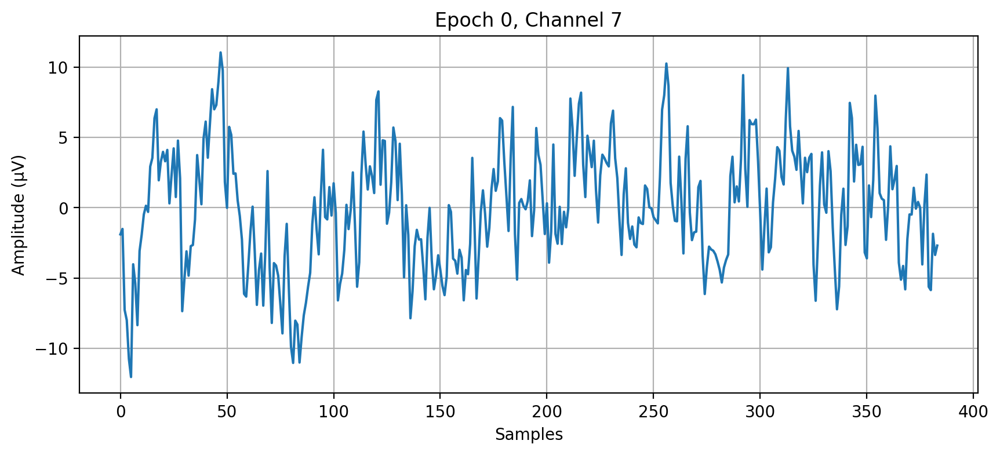

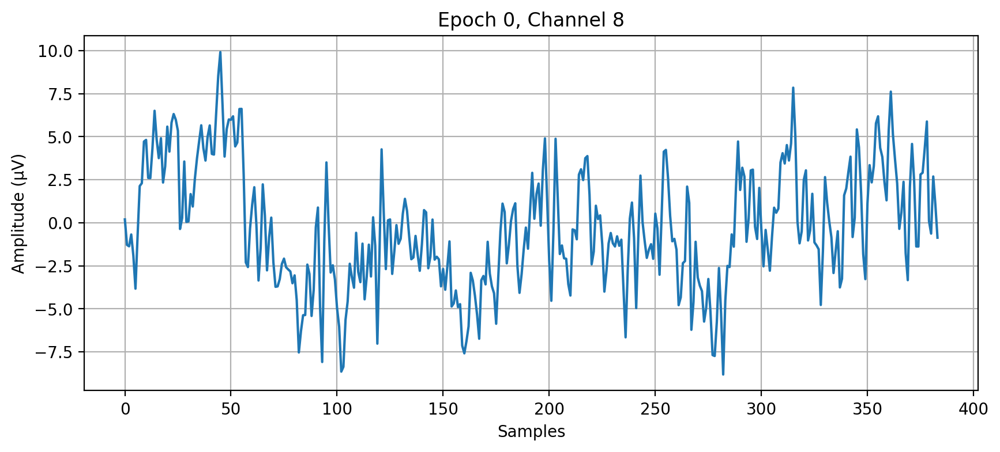

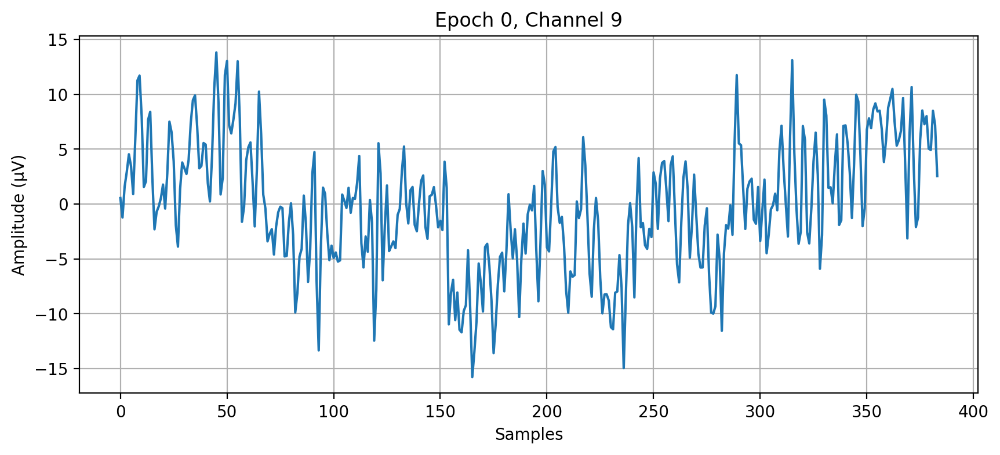

In [2]:
import matplotlib.pyplot as plt
for i in range(1,10):
    epoch = 0
    ch = i

    plt.figure(figsize=(10, 4))
    plt.plot(data[epoch, ch, :])
    plt.title(f"Epoch {epoch}, Channel {ch}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude (µV)")
    plt.grid(True)
    plt.show()

✅ Montaggio caricato: 63 canali
['A1', 'AF7', 'AF3', 'Fp1', 'FP2', 'AF4', 'AF8', 'A2', 'F7', 'F5']
Canali tenuti dopo filtro: 61


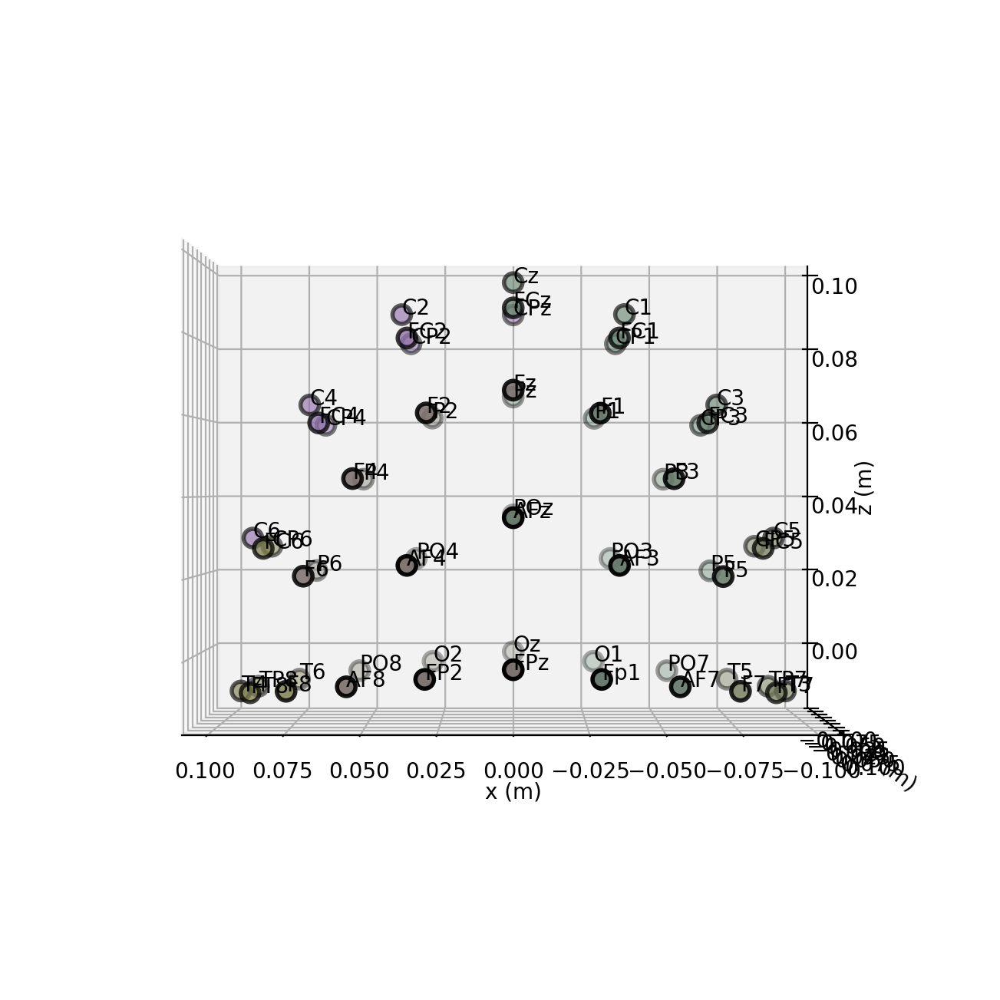

In [3]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Percorso al file .locs (aggiorna se necessario)
locs_path = "/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/scripts/data_processing/Preprocessing-main/ebneuro.locs"

# 1) Leggi il montage
montage = mne.channels.read_custom_montage(locs_path)
print(f"✅ Montaggio caricato: {len(montage.ch_names)} canali")
print(montage.ch_names[:10])

# 2) Calcola la media sulle epoche (richiede che `data` sia già caricato nella sessione)
try:
    data_mean = data.mean(axis=0)  # shape: (n_channels, n_times)
except NameError:
    raise NameError("La variabile `data` non è definita. Esegui prima la cella che carica il file .h5 (caricamento di `data`)")

sfreq = 256  # aggiorna se necessario

# 3) Rimuovi eventuali canali di riferimento non presenti nei dati (es. 'A1','A2')
chs_to_exclude = ['A1', 'A2']
ch_pos = montage.get_positions()['ch_pos']
chs_keep = [ch for ch in montage.ch_names if ch in ch_pos and ch not in chs_to_exclude]
print(f"Canali tenuti dopo filtro: {len(chs_keep)}")

# 4) Allinea la lista dei canali con i dati: se il montage ha più canali di `data`, tronca; se ne ha meno, solleva errore
if len(chs_keep) != data_mean.shape[0]:
    if len(chs_keep) > data_mean.shape[0]:
        chs_keep = chs_keep[:data_mean.shape[0]]
        print("Montage contiene più canali: taglio la lista per adattarla ai dati")
    else:
        raise ValueError("Il numero di canali nel montage è minore del numero di canali nei dati. Controlla montage vs data.")

# 5) Crea un montage ridotto con le posizioni dei canali tenuti
montage_reduced = mne.channels.make_dig_montage(
    ch_pos={ch: ch_pos[ch] for ch in chs_keep},
    coord_frame='head'
)

# 6) Crea info ed EvokedArray per i plot
info = mne.create_info(ch_names=chs_keep, sfreq=sfreq, ch_types='eeg')
evoked = mne.EvokedArray(data_mean[:len(chs_keep), :], info)
evoked.set_montage(montage_reduced)

# 7) Plot topomap 2D (singolo istante centrale) e sensori 3D
# calcola il tempo centrale dai campioni
n_times = data_mean.shape[1]
times = np.arange(n_times) / sfreq
mid_time = float(times[n_times // 2])

# Plot 3D dei sensori
fig=evoked.plot_sensors(kind='3d', show_names=True, ch_groups='position')
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial
plt.show()


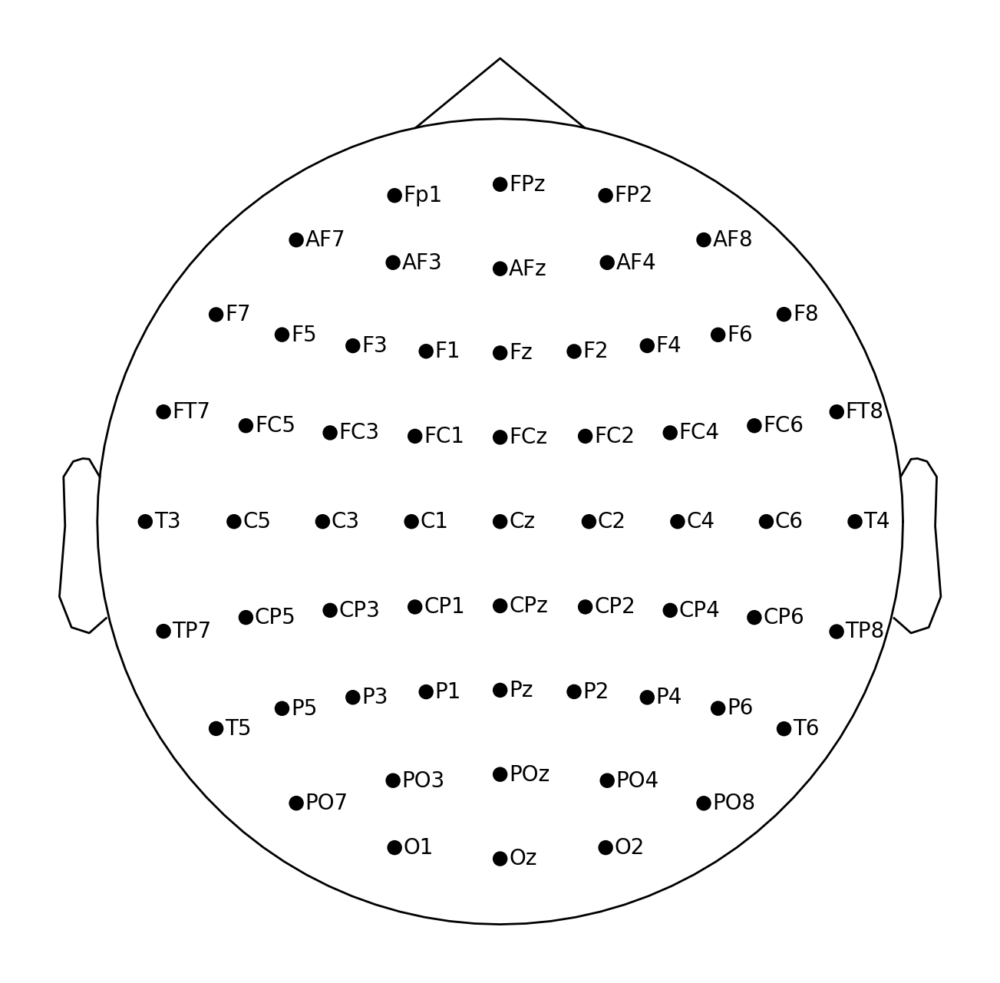

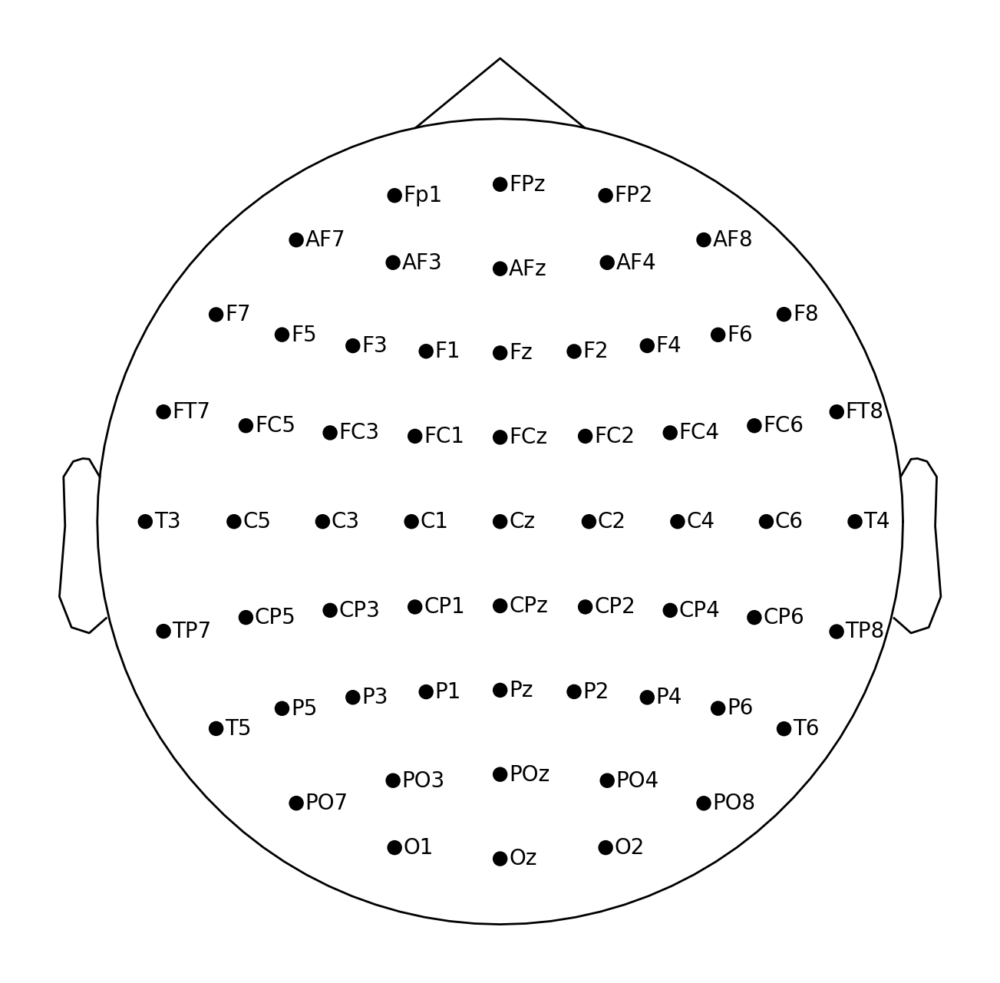

In [4]:
montage_reduced.plot(sphere=0.115)  # default radius of 0.095

In [5]:
import mne
import plotly.graph_objects as go

# Estrai le posizioni 3D degli elettrodi
montage_reduced = evoked.get_montage()
ch_pos = montage_reduced.get_positions()['ch_pos']

# Converti in liste per il plotting
xs, ys, zs, labels = [], [], [], []
for ch, pos in ch_pos.items():
    xs.append(pos[0])
    ys.append(pos[1])
    zs.append(pos[2])
    labels.append(ch)

# Crea il grafico 3D interattivo
fig = go.Figure()

# punti
fig.add_trace(go.Scatter3d(
    x=xs, y=ys, z=zs,
    mode='markers+text',
    text=labels,
    textposition='top center',
    marker=dict(size=6, color='blue'),
))

# aspetto 3D
fig.update_layout(
    title="EEG Scalp Electrodes (Interactive)",
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        aspectmode='data'
    ),
    width=700,
    height=700
)

fig.show()

In [6]:
import numpy as np

# media sulle epoche → ottieni potenza media per canale e tempo
power = np.mean(data ** 2, axis=0)   # shape: (61, 384)
print(power.shape)  # (61, 384)

(61, 384)


In [7]:
import numpy as np
import plotly.graph_objects as go

# === Calcola potenza media sulle epoche ===
power = np.mean(data ** 2, axis=0)  # shape: (61, 384)
n_times = power.shape[1]

frames = []
for t in range(n_times):
    frame = go.Frame(
        data=[go.Scatter3d(
            x=xs, y=ys, z=zs,
            mode='markers+text',
            text=labels,
            textposition='top center',
            marker=dict(
                size=7,
                color=power[:, t],
                colorscale='RdBu_r',
                cmin=np.min(power),
                cmax=np.max(power),
                colorbar=dict(title='Power [a.u.]')
            )
        )],
        name=str(t)
    )
    frames.append(frame)

fig = go.Figure(
    data=[go.Scatter3d(
        x=xs, y=ys, z=zs,
        mode='markers+text',
        text=labels,
        textposition='top center',
        marker=dict(
            size=7,
            color=power[:, 0],
            colorscale='RdBu_r',
            cmin=np.min(power),
            cmax=np.max(power),
            colorbar=dict(title='Power [a.u.]')
        )
    )],
    frames=frames
)

fig.update_layout(
    title='EEG Power Dynamics – EBNeuro Montage',
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode='data'
    ),
    width=900, height=800,
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[
            dict(label='Play',
                 method='animate',
                 args=[None, dict(frame=dict(duration=80, redraw=True),
                                  fromcurrent=True, mode='immediate')]),
            dict(label='Pause',
                 method='animate',
                 args=[[None], dict(frame=dict(duration=0, redraw=False),
                                    mode='immediate')])
        ]
    )]
)

fig.update_layout(sliders=[{
    "steps": [
        {"args": [[f.name], {"frame": {"duration": 0, "redraw": True},
                             "mode": "immediate"}],
         "label": f.name,
         "method": "animate"} for f in frames
    ],
    "transition": {"duration": 0},
    "x": 0.1,
    "len": 0.9
}])

fig.show()

### Distance Between Electrodes

In [8]:
from scipy.spatial import distance_matrix  
import seaborn as sns
import pandas as pd
import numpy as np
from typing import List, Tuple, Dict

In [9]:
ch_pos = montage.get_positions()['ch_pos']
names = [ch for ch in evoked.ch_names if ch in ch_pos]
pos_array = np.array([ch_pos[name][:3] for name in names])  # shape (n_ch, 3)

# Matrice delle distanze euclidee (metri)
euclidean_distance = distance_matrix(pos_array, pos_array)

In [10]:
euclidean_distance

array([[0.        , 0.03717509, 0.02969484, ..., 0.15769287, 0.17134299,
        0.17910162],
       [0.03717509, 0.        , 0.02887495, ..., 0.14224389, 0.16281532,
        0.17735329],
       [0.02969484, 0.02887495, 0.        , ..., 0.15962068, 0.1757918 ,
        0.18523448],
       ...,
       [0.15769287, 0.14224389, 0.15962068, ..., 0.        , 0.0375822 ,
        0.07362429],
       [0.17134299, 0.16281532, 0.1757918 , ..., 0.0375822 , 0.        ,
        0.03752369],
       [0.17910162, 0.17735329, 0.18523448, ..., 0.07362429, 0.03752369,
        0.        ]], shape=(61, 61))

In [11]:
df_euclidean_distance = pd.DataFrame(euclidean_distance, index=names, columns=names)

# salva CSV
df_euclidean_distance.to_csv('/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/interim/channel_pairwise_euclidean_distances.csv')

# esempio: distanza tra Cz e T4
print(df_euclidean_distance.loc['Cz','T4'])

0.14116689163402601


In [12]:
def geodesic_distance_matrix_from_ch_pos(ch_pos: Dict[str, np.ndarray],
                                         channel_order: List[str] = None,
                                         radius: float = None
                                        ) -> Tuple[List[str], np.ndarray]:
    """
    Calcola la matrice delle distanze geodetiche (m) tra tutti i canali di ch_pos.
    - ch_pos: dict {ch_name: (x,y,z)}
    - channel_order: ordine opzionale dei canali; se None usa le chiavi del dict
    - radius: raggio testa; se None viene stimato come media delle norm delle posizioni
    Ritorna: (names, D) con D shape (n_ch, n_ch), in metri.
    """
    if channel_order is None:
        names = list(ch_pos.keys())
    else:
        names = [ch for ch in channel_order if ch in ch_pos]

    P = np.array([ch_pos[ch][:3] for ch in names], dtype=float)  # (n,3)
    # stima raggio se non fornito
    norms = np.linalg.norm(P, axis=1)
    if radius is None:
        if not np.all(np.isfinite(norms)) or np.any(norms == 0):
            raise ValueError("Posizioni non valide (NaN/zero).")
        R = float(np.mean(norms))
    else:
        R = float(radius)

    # normalizza su sfera
    U = P / norms[:, None]  # (n,3) unit vectors

    # cos(theta) = U U^T
    dot = U @ U.T
    dot = np.clip(dot, -1.0, 1.0)
    theta = np.arccos(dot)          # radianti
    D_geo = R * theta               # metri
    return names, D_geo

In [13]:
ch_pos = montage.get_positions()['ch_pos'] 

names, df_geodesic_distance = geodesic_distance_matrix_from_ch_pos(ch_pos, channel_order=evoked.ch_names,radius=0.095)

# D_geo è la matrice NxN di distanze geodetiche in metri
import pandas as pd
df_geodesic_distance = pd.DataFrame(df_geodesic_distance, index=names, columns=names)

# salva CSV
df_geodesic_distance.to_csv('/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/interim/channel_pairwise_geodesic_distances.csv')
print("Distanza geodetica Fpz–Oz:", float(df_geodesic_distance.loc['Cz', 'T4']), "m")

Distanza geodetica Fpz–Oz: 0.15912826524889556 m


In [14]:
df_geodesic_distance

,AF7,AF3,Fp1,FP2,AF4,AF8,F7,F5,F3,F1,...,PO4,PO8,Oz,AFz,Fz,FCz,Cz,CPz,Pz,POz
AF7,0.000000,0.037416,0.029817,0.089093,0.100553,0.118629,0.029835,0.035062,0.053441,0.075036,...,0.270758,0.285128,0.238352,0.072107,0.096334,0.125375,0.155890,0.186018,2.135465e-01,2.337861e-01
AF3,0.037416,0.000000,0.028987,0.072031,0.072091,0.100498,0.060783,0.043573,0.035324,0.042437,...,0.251374,0.270798,0.255794,0.037459,0.059244,0.091242,0.125687,0.160745,1.955612e-01,2.287374e-01
Fp1,0.029817,0.028987,0.000000,0.059377,0.072031,0.089037,0.059651,0.057517,0.061803,0.070931,...,0.277992,0.266718,0.268041,0.049698,0.082479,0.117803,0.153699,0.189522,2.245068e-01,2.558072e-01
FP2,0.089093,0.072031,0.059377,0.000000,0.028987,0.029761,0.118854,0.113620,0.105195,0.094402,...,0.229671,0.208636,0.268041,0.049698,0.082479,0.117803,0.153699,0.189522,2.245068e-01,2.558072e-01
AF4,0.100553,0.072091,0.072031,0.028987,0.000000,0.037379,0.129525,0.115551,0.098206,0.078844,...,0.210994,0.201739,0.255794,0.037459,0.059244,0.091242,0.125687,0.160745,1.955612e-01,2.287374e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FCz,0.125375,0.091242,0.117803,0.117803,0.091242,0.125356,0.135300,0.105638,0.076262,0.050339,...,0.160745,0.186025,0.189012,0.075604,0.037832,0.000000,0.037790,0.075580,1.134115e-01,1.511835e-01
Cz,0.155890,0.125687,0.153699,0.153699,0.125687,0.155884,0.157606,0.128809,0.102843,0.083277,...,0.125687,0.155884,0.151222,0.113394,0.075622,0.037790,0.000000,0.037790,7.562159e-02,1.133936e-01
CPz,0.186018,0.160745,0.189522,0.189522,0.160745,0.186026,0.179020,0.153945,0.132981,0.118605,...,0.091241,0.125357,0.113432,0.151183,0.113411,0.075580,0.037790,0.000000,3.783169e-02,7.560368e-02
Pz,0.213546,0.195561,0.224507,0.224507,0.195561,0.213572,0.196884,0.178679,0.164075,0.154560,...,0.059244,0.096302,0.075601,0.189015,0.151243,0.113411,0.075622,0.037832,1.415610e-09,3.777200e-02


<Axes: >

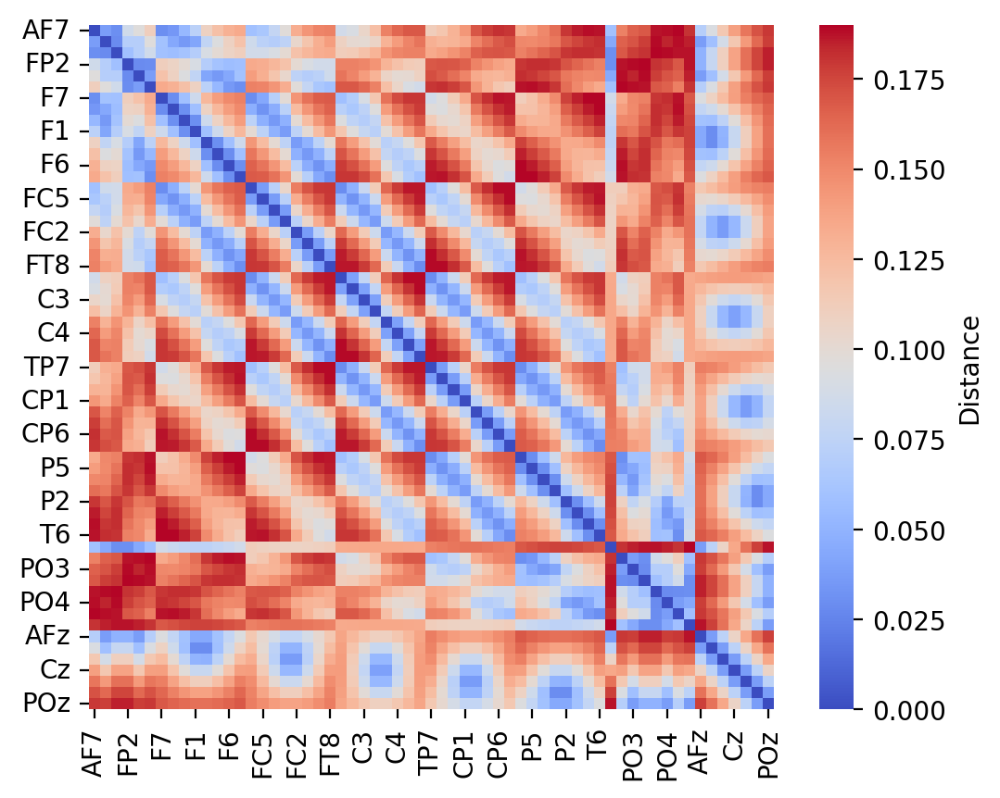

In [15]:
sns.heatmap(df_euclidean_distance, cmap="coolwarm", square=True, cbar_kws={"label": "Distance"})

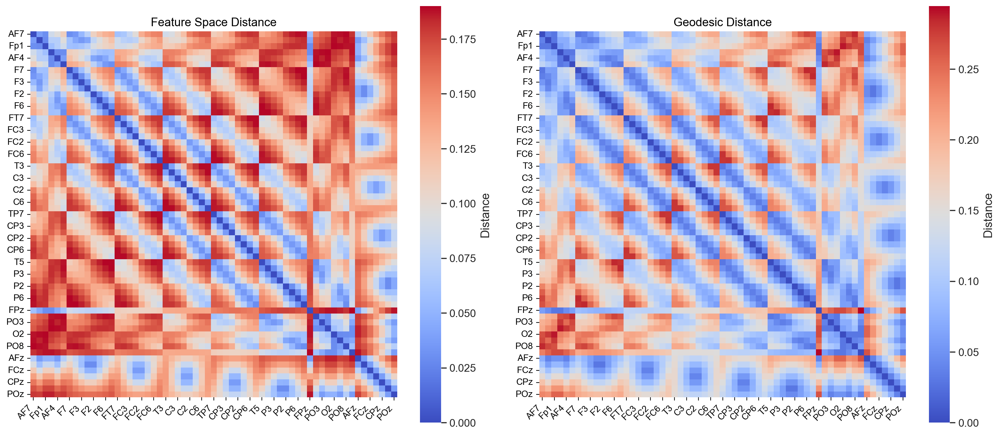

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
sns.set(style="white", font_scale=1.1)

sns.heatmap(df_euclidean_distance, cmap="coolwarm", square=True, ax=axes[0], annot=False, cbar_kws={"label": "Distance"})
axes[0].set_title("Feature Space Distance")

sns.heatmap(df_geodesic_distance, cmap="coolwarm", square=True, ax=axes[1], annot=False, cbar_kws={"label": "Distance"})
axes[1].set_title("Geodesic Distance")

for ax in axes:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

plt.tight_layout()
plt.show()

### Tensor Involvement

In [17]:
import torch

tensor_data = torch.from_numpy(data.astype('float32'))

print("tensor_data shape:", tensor_data.shape, "dtype:", tensor_data.dtype)

tensor_data shape: torch.Size([214, 61, 384]) dtype: torch.float32


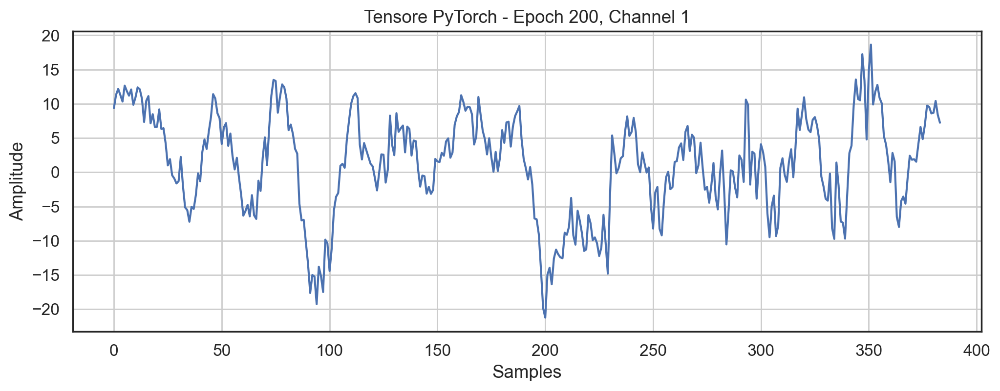

Min: -21.235, Max: 18.643, Mean: 1.185


In [18]:
# Visualizza il tensore: plot di una singola epoca/canale
import matplotlib.pyplot as plt

epoch_idx = 200  # prima epoca
channel_idx = 1  # sesto canale (es. Cz o altro)

# estrai i dati (converti in NumPy per il plotting)
signal = tensor_data[epoch_idx, channel_idx, :].numpy()

plt.figure(figsize=(12, 4))
plt.plot(signal)
plt.title(f"Tensore PyTorch - Epoch {epoch_idx}, Channel {channel_idx}")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

print(f"Min: {signal.min():.3f}, Max: {signal.max():.3f}, Mean: {signal.mean():.3f}")

In [19]:
# Statistiche descrittive del tensore
import torch

print("="*50)
print("📊 STATISTICHE TENSORE")
print("="*50)
print(f"Shape: {tensor_data.shape}")
print(f"Dtype: {tensor_data.dtype}")
print(f"Device: {tensor_data.device}")
print(f"Requires grad: {tensor_data.requires_grad}")
print(f"\nMin: {tensor_data.min().item():.4f}")
print(f"Max: {tensor_data.max().item():.4f}")
print(f"Mean: {tensor_data.mean().item():.4f}")
print(f"Std: {tensor_data.std().item():.4f}")
print(f"\nMemory (MB): {tensor_data.element_size() * tensor_data.nelement() / (1024**2):.2f}")
print("="*50)

📊 STATISTICHE TENSORE
Shape: torch.Size([214, 61, 384])
Dtype: torch.float32
Device: cpu
Requires grad: False

Min: -98.8671
Max: 123.5754
Mean: -0.0007
Std: 6.8652

Memory (MB): 19.12


### Graph Neural Network - EEG Electrodes Graph

In [20]:
!pip install torch
!pip install ogb
!pip install torch_geometric
!pip install networkx

In [21]:
import os
import torch
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv

In [22]:
import torch
import numpy as np

# === COSTRUZIONE DEL GRAFO EEG ===
# Nodi = elettrodi EEG (61 canali)
# Archi = connessioni basate sulla distanza geodetica

# 1) Node features: posizioni 3D (x, y, z) di ogni elettrodo
ch_pos = montage_reduced.get_positions()['ch_pos']
node_names = [ch for ch in evoked.ch_names if ch in ch_pos]  # ordine consistente
node_positions = np.array([ch_pos[name][:3] for name in node_names], dtype=np.float32)

# converti in tensore PyTorch
node_features = torch.from_numpy(node_positions)  # shape: (61, 3)

print("📊 EEG Electrode Graph")
print("="*50)
print(f"Numero nodi (elettrodi): {node_features.shape[0]}")
print(f"Numero features per nodo: {node_features.shape[1]} (x, y, z)")
print(f"Nomi elettrodi: {node_names[:10]}... (primi 10)")

# 2) Edge index: connetti elettrodi vicini (distanza < soglia)
# Usa la matrice geodetica già calcolata
threshold_distance = 0.08  # metri (8 cm) - adatta come preferisci

# recupera la matrice geodetica (deve essere già stata calcolata)
if 'df_geodesic_distance' not in globals():
    raise NameError("Calcola prima df_geodesic_distance! Esegui la cella con geodesic_distance_matrix_from_ch_pos")

geo_dist = df_geodesic_distance.values  # matrice NxN

# trova tutte le coppie (i, j) con distanza < threshold
sources = []
targets = []
edge_weights = []

for i in range(len(node_names)):
    for j in range(i+1, len(node_names)):  # evita duplicati e self-loops
        dist = geo_dist[i, j]
        if dist < threshold_distance and dist > 0:  # esclude diagonale
            # aggiungi entrambe le direzioni (grafo non diretto)
            sources.extend([i, j])
            targets.extend([j, i])
            edge_weights.extend([dist, dist])

# crea edge_index come tensore 2×E
edge_index = torch.tensor([sources, targets], dtype=torch.long)
edge_attr = torch.tensor(edge_weights, dtype=torch.float).unsqueeze(1)  # shape (E, 1)

print(f"\nSoglia distanza: {threshold_distance} m")
print(f"Numero connessioni (edges): {edge_index.shape[1]}")
print(f"Densità grafo: {edge_index.shape[1] / (len(node_names) * (len(node_names)-1)):.2%}")
print("="*50)

📊 EEG Electrode Graph
Numero nodi (elettrodi): 61
Numero features per nodo: 3 (x, y, z)
Nomi elettrodi: ['AF7', 'AF3', 'Fp1', 'FP2', 'AF4', 'AF8', 'F7', 'F5', 'F3', 'F1']... (primi 10)

Soglia distanza: 0.08 m
Numero connessioni (edges): 804
Densità grafo: 21.97%


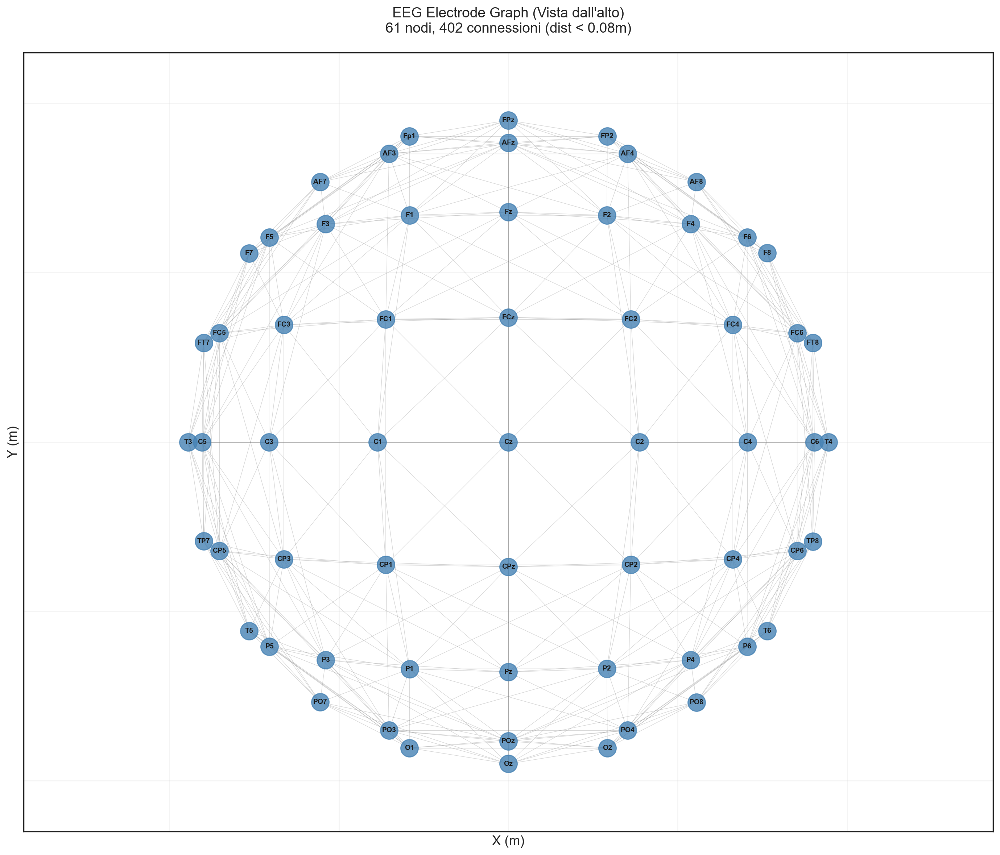

✅ Grafo creato: 61 nodi, 402 archi
Grado medio: 13.2 connessioni/elettrodo


In [23]:
# Visualizza il grafo EEG (proiezione 2D delle posizioni 3D)
import matplotlib.pyplot as plt
import networkx as nx

# Crea grafo NetworkX
G = nx.Graph()

# Aggiungi nodi con attributi (posizioni 3D)
for i, name in enumerate(node_names):
    G.add_node(i, name=name, pos=node_positions[i])

# Aggiungi archi (considera solo direzioni uniche)
edges_added = set()
for i in range(edge_index.shape[1]):
    src, tgt = edge_index[0, i].item(), edge_index[1, i].item()
    edge = tuple(sorted([src, tgt]))
    if edge not in edges_added:
        G.add_edge(src, tgt, weight=edge_attr[i].item())
        edges_added.add(edge)

# Layout: usa proiezione XY delle posizioni reali (vista dall'alto)
pos = {i: (node_positions[i][0], node_positions[i][1]) for i in range(len(node_names))}

# Etichette abbreviate (primi 3 caratteri per leggibilità)
labels = {i: node_names[i] for i in range(len(node_names))}

# Plot
plt.figure(figsize=(14, 12))

# disegna nodi
nx.draw_networkx_nodes(G, pos, node_color='steelblue', node_size=300, alpha=0.8)

# disegna archi (più sottili se tante connessioni)
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.3, edge_color='gray')

# disegna etichette
nx.draw_networkx_labels(G, pos, labels, font_size=7, font_weight='bold')

plt.title(f'EEG Electrode Graph (Vista dall\'alto)\n{len(G.nodes())} nodi, {len(G.edges())} connessioni (dist < {threshold_distance}m)', 
          fontsize=14, pad=20)
plt.xlabel('X (m)')
plt.ylabel('Y (m)')
plt.grid(True, alpha=0.2)
plt.axis('equal')
plt.tight_layout()
plt.show()

print(f"✅ Grafo creato: {len(G.nodes())} nodi, {len(G.edges())} archi")
print(f"Grado medio: {np.mean([deg for node, deg in G.degree()]):.1f} connessioni/elettrodo")

In [24]:
# Plot 3D interattivo del grafo EEG con plotly
# ricava nodi e archi unici (src < tgt)
unique_edges = []
weights = []
for k in range(edge_index.shape[1]):
    i = int(edge_index[0, k].item())
    j = int(edge_index[1, k].item())
    if i < j:  # unica direzione per grafo non diretto
        unique_edges.append((i, j))
        weights.append(float(edge_attr[k].item()))

# costruisci coordinate per gli archi (una singola trace con segmenti separati da None)
edge_x, edge_y, edge_z = [], [], []
for (i, j) in unique_edges:
    xi, yi, zi = node_positions[i]
    xj, yj, zj = node_positions[j]
    edge_x += [float(xi), float(xj), None]
    edge_y += [float(yi), float(yj), None]
    edge_z += [float(zi), float(zj), None]

# coordinate nodi
xs = node_positions[:, 0].tolist()
ys = node_positions[:, 1].tolist()
zs = node_positions[:, 2].tolist()

# crea figure
edge_trace = go.Scatter3d(
    x=edge_x, y=edge_y, z=edge_z,
    mode='lines',
    line=dict(color='lightgray', width=2),
    hoverinfo='none',
    name='Edges'
)

node_trace = go.Scatter3d(
    x=xs, y=ys, z=zs,
    mode='markers+text',
    marker=dict(size=5, color='steelblue', opacity=0.9),
    text=[n for n in node_names],
    textposition='top center',
    hovertext=[f"{i}: {n}" for i, n in enumerate(node_names)],
    hoverinfo='text',
    name='Electrodes'
)

fig = go.Figure(data=[edge_trace, node_trace])
fig.update_layout(
    title=f'EEG Electrode Graph 3D (soglia {threshold_distance} m) — {len(node_names)} nodi, {len(unique_edges)} archi',
    scene=dict(
        xaxis=dict(title='X (m)'),
        yaxis=dict(title='Y (m)'),
        zaxis=dict(title='Z (m)'),
        aspectmode='data'
    ),
    width=900,
    height=800,
    showlegend=False
)

fig.show()

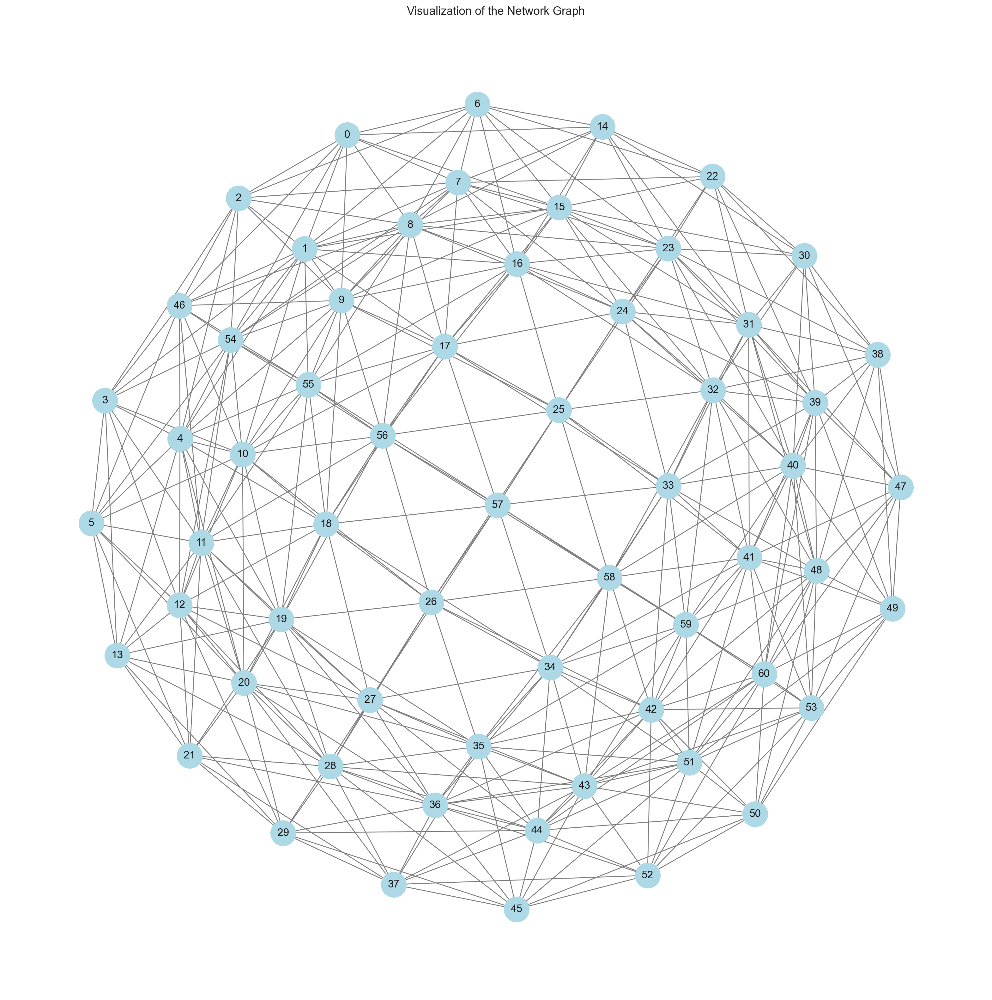

In [25]:
import networkx as nx
import matplotlib.pyplot as plt
 
# Convert the edge_index tensor to a list of edge tuples
edge_list = edge_index.t().tolist()
 
# Create a NetworkX graph from the edge list
G = nx.Graph()
G.add_edges_from(edge_list)
 
# Optionally, include nodes that might be isolated (e.g., person 3)
G.add_nodes_from(range(node_features.size(0)))
 
# Generate a layout for the nodes
pos = nx.spring_layout(G, seed=42)  # fixed seed for reproducibility
 
# Draw the graph with labels
plt.figure(figsize=(20, 20))
nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=800)
plt.title("Visualization of the Network Graph")
plt.axis('off')
plt.show()

### TEST2 PYGRAPH

In [ ]:
import torch
import numpy as np
import pandas as pd
from torch_geometric.data import Data
from torch_geometric.utils import remove_self_loops

# === 1) INPUT ===
# tensor_data : torch.Size([214, 61, 384])
# df_geodesic_distance : DataFrame 61x61 con le distanze tra elettrodi (in metri)
# node_names e node_positions ottenibili da montage_reduced

num_epochs, num_nodes, num_samples = tensor_data.shape
print(f"EEG data shape: {tensor_data.shape} → {num_epochs} epoche, {num_nodes} nodi, {num_samples} campioni")

# === 2) COSTRUZIONE DEGLI ARCHI (basato sulla distanza geodetica) ===
threshold_distance = 0.06  # 8 cm, adatta se serve

dist = df_geodesic_distance.values
i_idx, j_idx = np.where((dist < threshold_distance) & (dist > 0))

# 🔹 Rimuovi duplicati e self-loops
mask = i_idx < j_idx           # evita archi doppi (grafo non diretto)
i_idx, j_idx = i_idx[mask], j_idx[mask]

edges = np.vstack((i_idx, j_idx))
edge_index = torch.from_numpy(edges).long()

# 🔹 Rimozione di eventuali self-loops residui
edge_index, _ = remove_self_loops(edge_index)

# 🔹 Calcolo pesi degli archi (opzionale)
edge_weights = torch.from_numpy(1.0 / dist[i_idx, j_idx]).float().unsqueeze(1)

print(f"Numero archi: {edge_index.shape[1]}")
print(f"Esempio primi 5 archi:\n{edge_index[:, :5]}")

# === 3) COSTRUZIONE DEI GRAFI ===
graphs = []
for epoch in range(num_epochs):
    x = tensor_data[epoch]  # shape [61, 384]
    data_i = Data(x=x, edge_index=edge_index, edge_attr=edge_weights)
    graphs.append(data_i)

print(f"✅ Creati {len(graphs)} grafi EEG (uno per epoca)")
print(graphs[0])

EEG data shape: torch.Size([214, 61, 384]) → 214 epoche, 61 nodi, 384 campioni
Numero archi: 242
Esempio primi 5 archi:
tensor([[0, 0, 0, 0, 0],
        [1, 2, 6, 7, 8]])
✅ Creati 214 grafi EEG (uno per epoca)
Data(x=[61, 384], edge_index=[2, 242], edge_attr=[242, 1])


In [84]:
import matplotlib.pyplot as plt
import networkx as nx
from ipywidgets import interact

def plot_graph(data, node_positions=None):
    G = nx.Graph()
    edge_index = data.edge_index.numpy()
    G.add_edges_from(edge_index.T)

    if node_positions is not None:
        # Se ha 3 coordinate, prendi solo le prime due (x,y)
        pos = {i: node_positions[i][:2] for i in range(len(node_positions))}
    else:
        pos = nx.spring_layout(G, seed=42)

    plt.figure(figsize=(5, 5))
    nx.draw(G, pos, node_size=100, width=0.5, with_labels=False)
    plt.show()

@interact(epoch=(0, len(graphs)-1))
def scroll_graphs(epoch=0):
    print(f"Grafo epoca {epoch}")
    plot_graph(graphs[epoch], node_positions=node_positions)


interactive(children=(IntSlider(value=0, description='epoch', max=213), Output()), _dom_classes=('widget-inter…

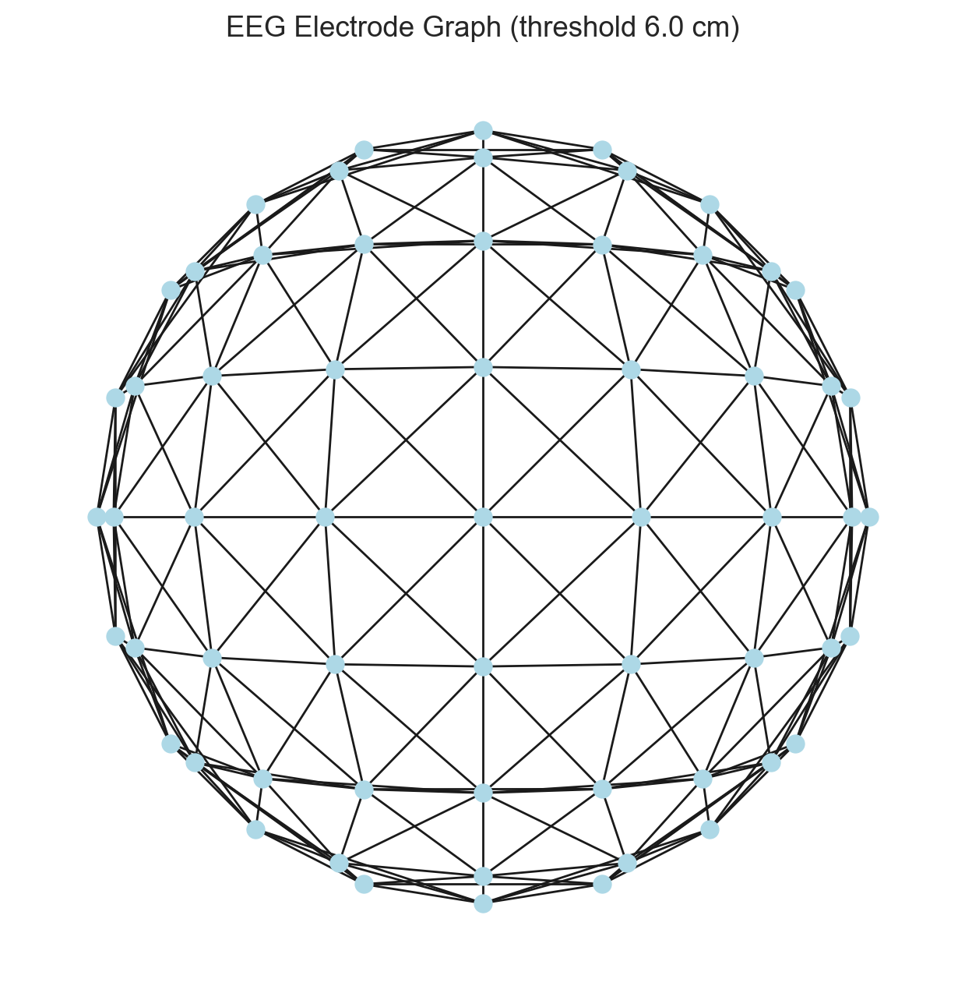

In [73]:
from torch_geometric.utils import to_networkx
import networkx as nx
import matplotlib.pyplot as plt

G = to_networkx(graphs[0], to_undirected=True)
pos = {i: montage_reduced.get_positions()['ch_pos'][node_names[i]][:2] for i in range(num_nodes)}

plt.figure(figsize=(6,6))
nx.draw(G, pos, node_size=60, node_color='lightblue', with_labels=False)
plt.title(f"EEG Electrode Graph (threshold {threshold_distance*100} cm)")
plt.savefig("graph_2d.png", dpi=150, bbox_inches='tight')
plt.show()


In [101]:
true_labels = [
    "arrivare","andare","aspettare","avere","capire","chiamare","chiedere",
    "conoscere","dare","dire","dovere","essere","fare","mettere","potere",
    "prendere","sapere","sentire","trovare","venire","aprire","chiudere",
    "mangiare","bere","accendere","spegnere","volere","bene","si","no",
    "più","poco","molto","sempre","adesso","poi","male","sopra","sotto",
    "destra","sinistra","avanti","indietro","oggi","domani","ieri","forse",
    "prima","perchè","anche","come","però","quindi","quando","dove","se",
    "oppure","io","lui","lei","noi","voi","loro","tu","questo","quello",
    "buono","bello","cattivo","brutto","grande","piccolo","nuovo","vecchio",
    "cosa","parte","anno","casa","problema","aiuto","tempo","lavoro",
    "persona","acqua","cibo","bisogno","donna","uomo","gruppo","guerra",
    "idea","macchina","mano","oggetto","telefono","computer","domanda",
    "uno","mille","paura","ansia","gioia","felicità","tristezza","serenità",
    "amore","morte","bagno","dolore","riposo"
]
import re

def normalize_label(raw):
    """Rimuove '_img', corregge accenti e uniforma ai lemmi ufficiali."""
    if isinstance(raw, (bytes, bytearray)):
        try:
            s = raw.decode('utf-8')
        except UnicodeDecodeError:
            s = raw.decode('latin-1', errors='ignore').encode('utf-8', errors='ignore').decode('utf-8')
    else:
        s = str(raw)

    s = s.replace('\x00', '').strip().lower()
    s = re.sub(r'_img$', '', s)  # togli suffisso _img

    # correzioni di accenti comuni (mojibake)
    s = (s.replace('Ã¨', 'è')
           .replace('Ã©', 'é')
           .replace('Ã²', 'ò')
           .replace('Ã ', 'à')
           .replace('Ã¹', 'ù')
           .replace('Ã¬', 'ì')
           .replace('Â', '')
           .replace('ã', 'à')
           .replace('π¹', 'ù'))

    s = s.strip()

    # fallback: se per caso non combacia esattamente ma esiste nel dizionario senza accento
    for t in true_labels:
        if s == t or s == t.replace("è", "e").replace("à", "a").replace("ù", "u").replace("ì", "i").replace("ò", "o"):
            return t
    return s

import numpy as np, h5py, json
from pathlib import Path

data_dir = Path("/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/processed/")
all_labels = []

for file in sorted(data_dir.glob("*.h5")):
    with h5py.File(file, "r") as f:
        raw_labels = f["labels"][:]
        all_labels.extend([normalize_label(lbl) for lbl in raw_labels])

unique_labels = sorted(set(all_labels))
print("Totale label uniche pulite:", len(unique_labels))
print(unique_labels[:20])

# mapping numerico ↔︎ letterale
label2idx = {lab: i for i, lab in enumerate(true_labels)}
idx2label = {i: lab for lab, i in label2idx.items()}

with open(data_dir.parent / "interim/label2idx.json", "w", encoding="utf-8") as f:
    json.dump(label2idx, f, ensure_ascii=False, indent=2)
with open(data_dir.parent / "interim/idx2label.json", "w", encoding="utf-8") as f:
    json.dump(idx2label, f, ensure_ascii=False, indent=2)

print("✅ Mapping creato e salvato.")



Totale label uniche pulite: 110
['accendere', 'acqua', 'adesso', 'aiuto', 'amore', 'anche', 'andare', 'anno', 'ansia', 'aprire', 'arrivare', 'aspettare', 'avanti', 'avere', 'bagno', 'bello', 'bene', 'bere', 'bisogno', 'brutto']
✅ Mapping creato e salvato.


In [113]:
import h5py
import pandas as pd
from pathlib import Path
import json

def build_eeg_dataframe(h5_dir, label_map_path):
    with open(label_map_path, "r", encoding="utf-8") as f:
        label2idx = json.load(f)

    rows = []
    for file in sorted(Path(h5_dir).glob("*.h5")):
        subject_id, session_id = file.stem.split("_")
        with h5py.File(file, "r") as f:
            data = f["data"]
            labels = f["labels"][:]
            n_epochs, n_channels, n_samples = data.shape

            for i, lbl_raw in enumerate(labels):
                label_name = normalize_label(lbl_raw)
                label_idx = label2idx.get(label_name, -1)
                rows.append({
                    "subject_id": subject_id,
                    "session_id": session_id,
                    "epoch_idx": i,
                    "label_name": label_name,
                    "label_idx": label_idx,
                    "n_channels": n_channels,
                    "n_samples": n_samples,
                    "path_h5": str(file)
                })

    df = pd.DataFrame(rows)
    return df


In [115]:
meta_df_eeg = build_eeg_dataframe(
    h5_dir="/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/processed/",
    label_map_path="/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/interim/label2idx.json"
)
meta_df_eeg.to_csv("/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS_Thesis/data/interim/eeg_metadata.csv", index=False)

meta_df_eeg

,subject_id,session_id,epoch_idx,label_name,label_idx,n_channels,n_samples,path_h5
0,11,S001,0,cibo,84,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
1,11,S001,1,aprire,20,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
2,11,S001,2,mettere,13,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
3,11,S001,3,nuovo,72,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
4,11,S001,4,bello,67,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
...,...,...,...,...,...,...,...,...
1089,11,S005,215,avere,3,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
1090,11,S005,216,mangiare,22,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
1091,11,S005,217,cosa,74,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...
1092,11,S005,218,nuovo,72,61,384,/Users/dani/Documents/Thesis_ImaSpe/Daniele_IS...


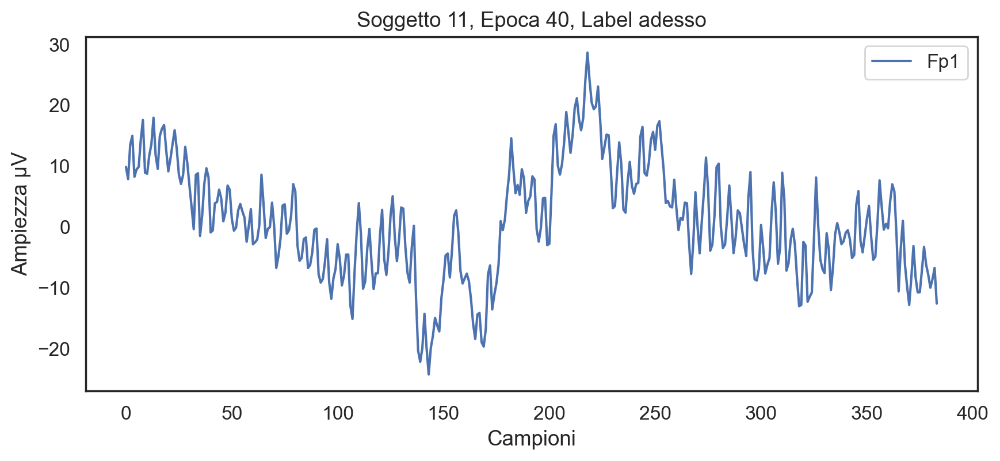

In [127]:
import matplotlib.pyplot as plt
import numpy as np
import h5py

row = meta_df_eeg[meta_df_eeg["label_name"] == "adesso"].iloc[0]

with h5py.File(row["path_h5"], "r") as f:
    signal = f["data"][row["epoch_idx"]]  

plt.figure(figsize=(10,4))
plt.plot(signal[0], label="Fp1")
plt.title(f"Soggetto {row.subject_id}, Epoca {row.epoch_idx}, Label {row.label_name}")
plt.xlabel("Campioni")
plt.ylabel("Ampiezza µV")
plt.legend()
plt.show()
